In [45]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/myanimelist-dataset/user-filtered.csv
/kaggle/input/myanimelist-dataset/users-score-2023.csv
/kaggle/input/myanimelist-dataset/anime-filtered.csv
/kaggle/input/myanimelist-dataset/anime-dataset-2023.csv
/kaggle/input/myanimelist-dataset/final_animedataset.csv
/kaggle/input/myanimelist-dataset/users-details-2023.csv


In [46]:
!pip install wordcloud -q

In [47]:
!pip install plotly

In [48]:
!pip install langdetect

In [49]:
### Basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import pickle
import warnings
warnings.filterwarnings(action='ignore')

In [50]:
# Visualization
import plotly.express as px
import plotly.graph_objects as go  # for 3D plot visualization
import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

from wordcloud import WordCloud
from langdetect import detect
from datetime import datetime

In [51]:
#Loading the dataset

# Setting column display to None
pd.set_option('display.max_columns',None)

In [52]:
# Importing anime details dataframe
df_anime=pd.read_csv('/kaggle/input/myanimelist-dataset/anime-dataset-2023.csv')
print("Shape of the Dataset:",df_anime.shape)
df_anime.head(3)

Shape of the Dataset: (24905, 24)


,anime_id,Name,English name,Other name,Score,Genres,Synopsis,Type,Episodes,Aired,Premiered,Status,Producers,Licensors,Studios,Source,Duration,Rating,Rank,Popularity,Favorites,Scored By,Members,Image URL
0,1,Cowboy Bebop,Cowboy Bebop,カウボーイビバップ,8.75,"Action, Award Winning, Sci-Fi","Crime is timeless. By the year 2071, humanity ...",TV,26.0,"Apr 3, 1998 to Apr 24, 1999",spring 1998,Finished Airing,Bandai Visual,"Funimation, Bandai Entertainment",Sunrise,Original,24 min per ep,R - 17+ (violence & profanity),41.0,43,78525,914193.0,1771505,https://cdn.myanimelist.net/images/anime/4/196...
1,5,Cowboy Bebop: Tengoku no Tobira,Cowboy Bebop: The Movie,カウボーイビバップ 天国の扉,8.38,"Action, Sci-Fi","Another day, another bounty—such is the life o...",Movie,1.0,"Sep 1, 2001",UNKNOWN,Finished Airing,"Sunrise, Bandai Visual",Sony Pictures Entertainment,Bones,Original,1 hr 55 min,R - 17+ (violence & profanity),189.0,602,1448,206248.0,360978,https://cdn.myanimelist.net/images/anime/1439/...
2,6,Trigun,Trigun,トライガン,8.22,"Action, Adventure, Sci-Fi","Vash the Stampede is the man with a $$60,000,0...",TV,26.0,"Apr 1, 1998 to Sep 30, 1998",spring 1998,Finished Airing,Victor Entertainment,"Funimation, Geneon Entertainment USA",Madhouse,Manga,24 min per ep,PG-13 - Teens 13 or older,328.0,246,15035,356739.0,727252,https://cdn.myanimelist.net/images/anime/7/203...


In [ ]:
# Importing user details dataframe
df_user=pd.read_csv('/kaggle/input/myanimelist-dataset/users-details-2023.csv')
print("Shape of the Dataset:",df_user.shape)
df_user.head()

In [ ]:
# Importing user score dataframe
df_score=pd.read_csv('/kaggle/input/myanimelist-dataset/users-score-2023.csv')
print("Shape of the dataset:",df_score.shape)
df_score.head()

In [53]:
#EDA Begins
df_anime.head(2)

,anime_id,Name,English name,Other name,Score,Genres,Synopsis,Type,Episodes,Aired,Premiered,Status,Producers,Licensors,Studios,Source,Duration,Rating,Rank,Popularity,Favorites,Scored By,Members,Image URL
0,1,Cowboy Bebop,Cowboy Bebop,カウボーイビバップ,8.75,"Action, Award Winning, Sci-Fi","Crime is timeless. By the year 2071, humanity ...",TV,26.0,"Apr 3, 1998 to Apr 24, 1999",spring 1998,Finished Airing,Bandai Visual,"Funimation, Bandai Entertainment",Sunrise,Original,24 min per ep,R - 17+ (violence & profanity),41.0,43,78525,914193.0,1771505,https://cdn.myanimelist.net/images/anime/4/196...
1,5,Cowboy Bebop: Tengoku no Tobira,Cowboy Bebop: The Movie,カウボーイビバップ 天国の扉,8.38,"Action, Sci-Fi","Another day, another bounty—such is the life o...",Movie,1.0,"Sep 1, 2001",UNKNOWN,Finished Airing,"Sunrise, Bandai Visual",Sony Pictures Entertainment,Bones,Original,1 hr 55 min,R - 17+ (violence & profanity),189.0,602,1448,206248.0,360978,https://cdn.myanimelist.net/images/anime/1439/...


In [54]:
df_anime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24905 entries, 0 to 24904
Data columns (total 24 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   anime_id      24905 non-null  int64 
 1   Name          24905 non-null  object
 2   English name  24905 non-null  object
 3   Other name    24905 non-null  object
 4   Score         24905 non-null  object
 5   Genres        24905 non-null  object
 6   Synopsis      24905 non-null  object
 7   Type          24905 non-null  object
 8   Episodes      24905 non-null  object
 9   Aired         24905 non-null  object
 10  Premiered     24905 non-null  object
 11  Status        24905 non-null  object
 12  Producers     24905 non-null  object
 13  Licensors     24905 non-null  object
 14  Studios       24905 non-null  object
 15  Source        24905 non-null  object
 16  Duration      24905 non-null  object
 17  Rating        24905 non-null  object
 18  Rank          24905 non-null  object
 19  Popu

In [55]:
df_anime.isna().sum()

anime_id        0
Name            0
English name    0
Other name      0
Score           0
Genres          0
Synopsis        0
Type            0
Episodes        0
Aired           0
Premiered       0
Status          0
Producers       0
Licensors       0
Studios         0
Source          0
Duration        0
Rating          0
Rank            0
Popularity      0
Favorites       0
Scored By       0
Members         0
Image URL       0
dtype: int64

In [56]:
# Preprocessing Score column
df_anime['Score'].value_counts()
#We need to replacce UNKNOWN by mean or median

Score
UNKNOWN    9213
6.31         80
6.54         80
6.25         79
6.51         79
           ... 
3.21          1
3.29          1
1.85          1
3.69          1
4.07          1
Name: count, Length: 567, dtype: int64

In [57]:
#Mean Score
scores = df_anime[df_anime['Score']!='UNKNOWN']['Score'].astype('float')
scores_mean = round(scores.mean(),2)
scores_mean

6.38

In [58]:
#Median Score
scores = df_anime[df_anime['Score']!='UNKNOWN']['Score'].astype('float')
scores_median = round(scores.median(),2)
scores_median

6.39

In [59]:
#Replacing unknown with mean value
df_anime['Score'] = df_anime['Score'].replace('UNKNOWN',scores_mean).astype('float64')

In [60]:
df_anime['Name'].value_counts() == 0

Name
Azur Lane          False
Utopia             False
Souseiki           False
Awakening          False
Cowboy Bebop       False
                   ...  
Mai Zhu            False
Sabage-bu!         False
"0"                False
Baka Misérables    False
Shijuuku Nichi     False
Name: count, Length: 24901, dtype: bool

In [61]:
#Changing English Unknown name to Original Japanese Name
df_anime['English name'] = np.where(df_anime['English name']=='UNKNOWN',df_anime['Name'],df_anime['English name'])

In [62]:
df_anime['Other name'] = np.where(df_anime['Other name']=='UNKNOWN',df_anime['Name'],df_anime['Other name'])

In [63]:
df_anime['Genres'].value_counts()

Genres
UNKNOWN                                          4929
Comedy                                           2279
Fantasy                                          1341
Hentai                                           1181
Drama                                             624
                                                 ... 
Avant Garde, Fantasy, Romance                       1
Action, Comedy, Romance, Supernatural, Hentai       1
Drama, Horror, Supernatural, Ecchi                  1
Adventure, Comedy, Romance, Sports                  1
Action, Adventure, Fantasy, Horror                  1
Name: count, Length: 1006, dtype: int64

In [65]:
df_anime['Genres'].apply(lambda x: x.split(',')).explode().value_counts()

Genres
Comedy            5140
UNKNOWN           4929
Action            4730
 Fantasy          3623
 Sci-Fi           2672
Adventure         2269
 Comedy           2002
 Romance          1756
Fantasy           1683
 Adventure        1573
Drama             1470
 Drama            1366
 Supernatural     1334
Hentai            1181
 Slice of Life    1099
Avant Garde        781
 Ecchi             743
 Mystery           685
Slice of Life      656
Sci-Fi             419
Sports             399
 Sports            372
 Horror            366
Romance            307
 Hentai            305
 Suspense          225
Horror             168
Mystery            162
Supernatural       160
Award Winning      151
Boys Love          146
 Gourmet            95
 Award Winning      90
 Girls Love         86
Ecchi               52
Gourmet             51
 Erotica            47
Girls Love          27
 Avant Garde        23
 Boys Love          23
Suspense            17
Erotica              7
Name: count, dtype: int64

In [66]:
#We will replace unknown genre with most frequent genres like Comedy
df_anime['Genres'] = df_anime['Genres'].replace('UNKNOWN','Comedy')

In [67]:
#Handling rank
df_anime['Rank'] = df_anime['Rank'].replace('UNKNOWN', 0.0).astype('float64')

In [100]:
df_anime['Scored By'] = df_anime['Scored By'].replace('UNKNOWN', 0.0).astype('float32')

In [101]:
df_anime['Scored By'].mean()

18886.082

In [102]:
df_anime['Scored By'] = df_anime['Scored By'].replace(0.0,df_anime['Scored By'].mean()).astype('float32')

In [96]:
df_anime['Episodes'] = df_anime['Episodes'].replace('UNKNOWN', 0.0).astype('float32')

In [103]:
#Changing object to float
df_anime['Score'] = df_anime['Score'].astype('float32')
df_anime['Rank'] = df_anime['Rank'].astype('float32')

In [104]:
#Using Aggregates

df_anime.groupby(['Type']).mean('Score')

,anime_id,Score,Episodes,Rank,Popularity,Favorites,Scored By,Members
Type,,,,,,,,
Movie,28964.001370,6.359740,1.102944,10607.781250,13426.331203,188.379137,20508.511719,23074.907327
Music,41975.809010,6.093708,1.165674,0.000000,16674.077811,3.213701,8959.333008,976.727103
ONA,40936.951882,6.193385,13.382960,11002.740234,14191.519955,47.868384,11732.745117,7047.844325
OVA,17220.204858,6.249161,2.367272,6334.471191,9933.961237,58.681796,10120.827148,13513.580226
Special,26146.474590,6.368612,2.446833,8626.709961,10213.566458,24.912432,10860.222656,14427.167318
TV,28485.515862,6.655601,38.310913,9068.531250,11122.027642,1246.061735,55097.968750,92545.318810
UNKNOWN,51941.527027,6.375946,1.459459,114.662163,8275.054054,20.270270,18633.000000,5831.121622


In [69]:
df_user.head(2)

,Mal ID,Username,Gender,Birthday,Location,Joined,Days Watched,Mean Score,Watching,Completed,On Hold,Dropped,Plan to Watch,Total Entries,Rewatched,Episodes Watched
0,1,Xinil,Male,1985-03-04T00:00:00+00:00,California,2004-11-05T00:00:00+00:00,142.3,7.37,1.0,233.0,8.0,93.0,64.0,399.0,60.0,8458.0
1,3,Aokaado,Male,NaN,"Oslo, Norway",2004-11-11T00:00:00+00:00,68.6,7.34,23.0,137.0,99.0,44.0,40.0,343.0,15.0,4072.0


In [70]:
df_user.isna().sum()

Mal ID                   0
Username                 1
Gender              506907
Birthday            563222
Location            578485
Joined                   0
Days Watched             8
Mean Score               8
Watching                 8
Completed                8
On Hold                  8
Dropped                  8
Plan to Watch            8
Total Entries            8
Rewatched                8
Episodes Watched         8
dtype: int64

In [71]:
df_user[df_user['Gender'].isna()]

,Mal ID,Username,Gender,Birthday,Location,Joined,Days Watched,Mean Score,Watching,Completed,On Hold,Dropped,Plan to Watch,Total Entries,Rewatched,Episodes Watched
3,9,Arcane,NaN,NaN,NaN,2004-12-05T00:00:00+00:00,30.0,7.71,5.0,54.0,4.0,3.0,0.0,66.0,0.0,1817.0
4,18,Mad,NaN,NaN,NaN,2005-01-03T00:00:00+00:00,52.0,6.27,1.0,114.0,10.0,5.0,23.0,153.0,42.0,3038.0
6,23,Amuro,NaN,1988-02-22T00:00:00+00:00,Canada,2005-01-23T00:00:00+00:00,142.5,7.41,20.0,298.0,5.0,19.0,50.0,392.0,0.0,8565.0
10,53,Ladholyman,NaN,NaN,NaN,2005-03-19T00:00:00+00:00,11.5,9.24,0.0,51.0,0.0,0.0,0.0,51.0,0.0,693.0
13,71,Smoka,NaN,NaN,NaN,2005-04-21T00:00:00+00:00,22.9,8.01,2.0,67.0,11.0,0.0,0.0,80.0,0.0,1295.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
731283,1291071,Fiswoul,NaN,NaN,NaN,2012-05-06T00:00:00+00:00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
731285,1291083,Dolopa,NaN,NaN,NaN,2012-05-06T00:00:00+00:00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
731286,1291085,alenrobnik,NaN,NaN,NaN,2012-05-06T00:00:00+00:00,21.4,8.22,16.0,58.0,9.0,1.0,42.0,126.0,0.0,1239.0
731287,1291087,Oblongata,NaN,1993-01-30T00:00:00+00:00,NaN,2012-05-06T00:00:00+00:00,51.3,7.53,38.0,175.0,0.0,9.0,211.0,433.0,2.0,3010.0


In [72]:
#Handling NaN username
df_user['Username'] = df_user['Username'].replace(np.NaN,'abc123')

In [73]:
#Handling Gender, Birthday, Location and other nan values
df_user['Gender'] = df_user['Gender'].replace(np.NaN,'Not Specified')
df_user['Birthday'] = df_user['Birthday'].replace(np.NaN,'Not Specified')
df_user['Location'] = df_user['Location'].replace(np.NaN,'Not Specified')

In [74]:
#Replacing other values with nan
for col in df_user.columns[6:]:
    df_user[col] = df_user[col].replace(np.NaN,0).astype('float64')
    

In [75]:
df_user.isna().sum()

Mal ID              0
Username            0
Gender              0
Birthday            0
Location            0
Joined              0
Days Watched        0
Mean Score          0
Watching            0
Completed           0
On Hold             0
Dropped             0
Plan to Watch       0
Total Entries       0
Rewatched           0
Episodes Watched    0
dtype: int64

In [76]:
df_user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731290 entries, 0 to 731289
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Mal ID            731290 non-null  int64  
 1   Username          731290 non-null  object 
 2   Gender            731290 non-null  object 
 3   Birthday          731290 non-null  object 
 4   Location          731290 non-null  object 
 5   Joined            731290 non-null  object 
 6   Days Watched      731290 non-null  float64
 7   Mean Score        731290 non-null  float64
 8   Watching          731290 non-null  float64
 9   Completed         731290 non-null  float64
 10  On Hold           731290 non-null  float64
 11  Dropped           731290 non-null  float64
 12  Plan to Watch     731290 non-null  float64
 13  Total Entries     731290 non-null  float64
 14  Rewatched         731290 non-null  float64
 15  Episodes Watched  731290 non-null  float64
dtypes: float64(10), int6

In [77]:
df_user['Joined'].value_counts()

Joined
2011-11-09T00:00:00+00:00    3892
2011-11-21T00:00:00+00:00    3828
2011-11-22T00:00:00+00:00    3798
2011-11-08T00:00:00+00:00    3674
2011-11-17T00:00:00+00:00    3563
                             ... 
2006-06-27T00:00:00+00:00       1
2006-07-02T00:00:00+00:00       1
2006-07-06T00:00:00+00:00       1
2006-07-07T00:00:00+00:00       1
2004-11-05T00:00:00+00:00       1
Name: count, Length: 2125, dtype: int64

In [78]:
df_score.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24325191 entries, 0 to 24325190
Data columns (total 5 columns):
 #   Column       Dtype 
---  ------       ----- 
 0   user_id      int64 
 1   Username     object
 2   anime_id     int64 
 3   Anime Title  object
 4   rating       int64 
dtypes: int64(3), object(2)
memory usage: 927.9+ MB


In [79]:
df_score.isna().sum()

user_id          0
Username       232
anime_id         0
Anime Title      0
rating           0
dtype: int64

In [80]:
df_score['Username'] = df_user['Username'].replace(np.NaN,'Not Specified')

In [81]:
df_score.value_counts()

user_id  Username         anime_id  Anime Title                         rating
1        1234567890       393       Escaflowne                          9         1
5767     m3ph1st0         199       Sen to Chihiro no Kamikakushi       8         1
         kaori-sann       7674      Bakuman.                            7         1
         keithnichols513  16355     Dansai Bunri no Crime Edge          7         1
         kelvinberg924    1686      Bleach Movie 1: Memories of Nobody  10        1
                                                                                 ..
3061     Ikutolover123    123       Fushigi Yuugi                       10        1
         Imthehero        306       Abenobashi Mahou☆Shoutengai         9         1
         InuxD            934       Higurashi no Naku Koro ni           9         1
         Ioscylla         2966      Ookami to Koushinryou               9         1
8768     zunder           42923     SK∞                                 8        

In [82]:
#Data Visualization

In [105]:
# Count the number of anime titles by type
type_counts = df_anime['Type'].value_counts()
type_counts

Type
TV         7597
Movie      4381
OVA        4076
ONA        3533
Music      2686
Special    2558
UNKNOWN      74
Name: count, dtype: int64

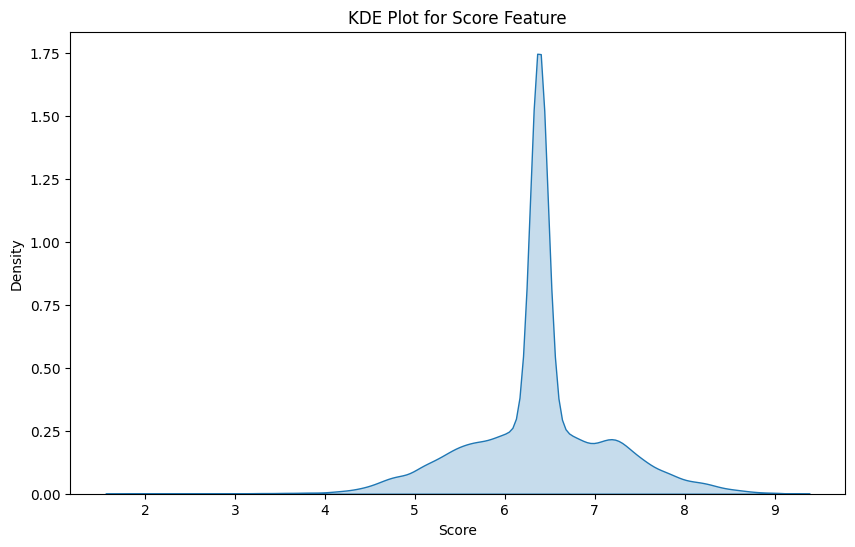

In [109]:
plt.figure(figsize=(10,6))
sns.kdeplot(data=df_anime,x='Score',fill=True)
plt.xlabel('Score')
plt.ylabel('Density')
plt.title('KDE Plot for Score Feature')
plt.show()

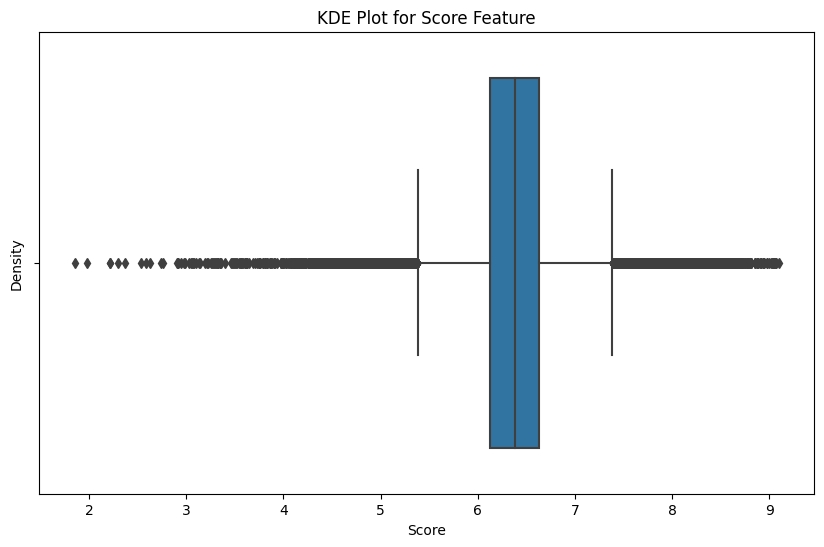

In [110]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df_anime,x='Score',orient='h')
plt.xlabel('Score')
plt.ylabel('Valuesa')
plt.title('BoxPlot Plot for Score')
plt.show()

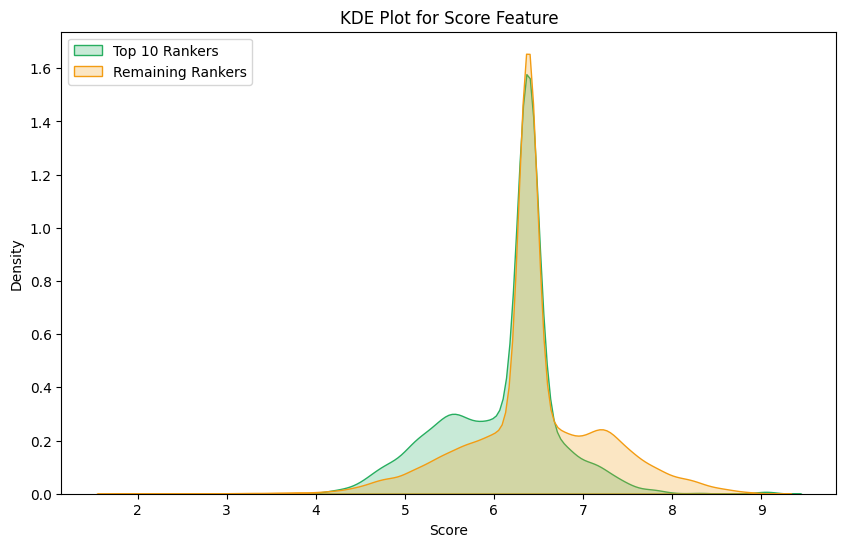

In [115]:
#Checking Score based on different parameters

top_score_anime = df_anime[df_anime['Rank'] <= 10]
remaining_score_anime = df_anime[df_anime['Rank'] > 10]

plt.figure(figsize=(10,6))
sns.kdeplot(data=top_score_anime,x='Score',fill=True,color='#27ae60')
sns.kdeplot(data=remaining_score_anime,x='Score',fill=True,color='#f39c12')
plt.legend(['Top 10 Rankers', 'Remaining Rankers'],loc='upper left')
plt.xlabel('Score')
plt.ylabel('Density')
plt.title('KDE Plot for Score')
plt.show()

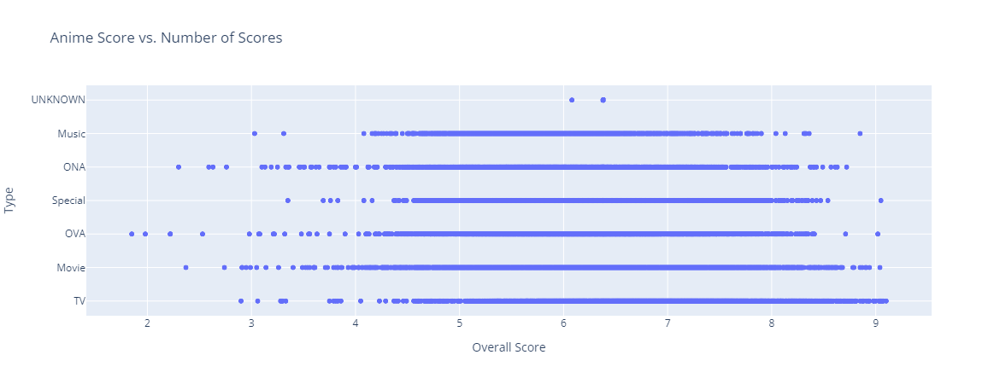

In [116]:
#Scatter plot for Score and Type
# Create a scatter plot
fig = px.scatter(df_anime, x='Score', y='Type', 
                 labels={'Score':'Overall Score', 'Members':'Number of Scores'}, 
                 title='Anime Score vs. Number of Scores')

fig.show()

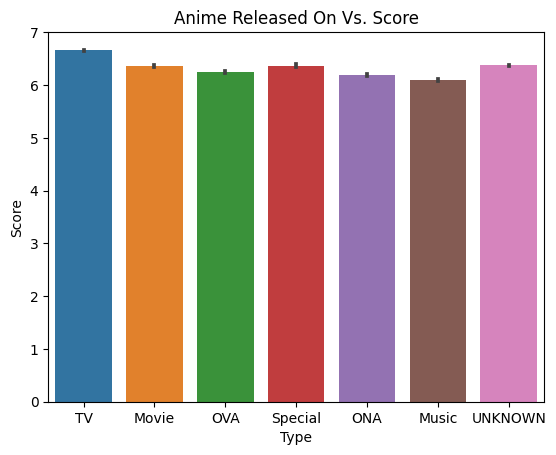

In [120]:
sns.barplot(data=df_anime,x='Type',y='Score')
plt.xlabel('Type')
plt.ylabel('Score')
plt.title('Anime Released On Vs. Score')
plt.show()

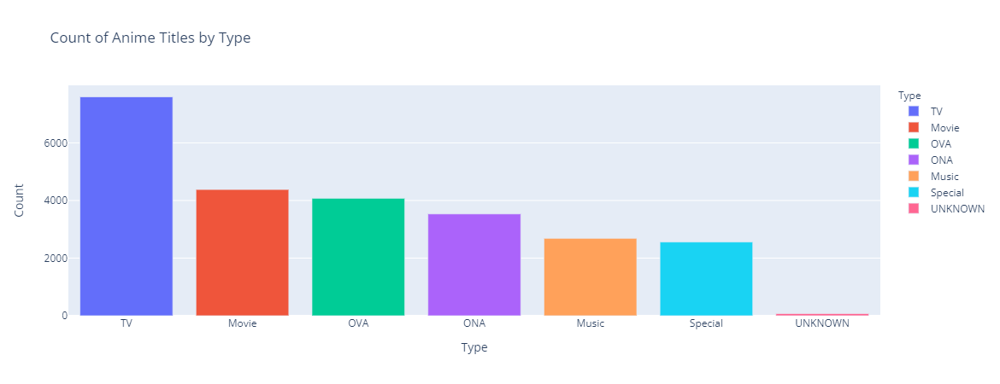

In [106]:
# Create a bar chart using plotly
fig = px.bar(type_counts, 
             x=type_counts.index, 
             y=type_counts.values, 
             color=type_counts.index, 
             labels={'x':'Anime Type', 'y':'Count'}, 
             title='Count of Anime Titles by Type')

fig.show()

In [121]:
df_anime.sort_values(by='Score',ascending=False)[:100]

,anime_id,Name,English name,Other name,Score,Genres,Synopsis,Type,Episodes,Aired,Premiered,Status,Producers,Licensors,Studios,Source,Duration,Rating,Rank,Popularity,Favorites,Scored By,Members,Image URL
3961,5114,Fullmetal Alchemist: Brotherhood,Fullmetal Alchemist: Brotherhood,鋼の錬金術師 FULLMETAL ALCHEMIST,9.10,"Action, Adventure, Drama, Fantasy",After a horrific alchemy experiment goes wrong...,TV,64.0,"Apr 5, 2009 to Jul 4, 2010",spring 2009,Finished Airing,"Aniplex, Square Enix, Mainichi Broadcasting Sy...","Funimation, Aniplex of America",Bones,Manga,24 min per ep,R - 17+ (violence & profanity),1.0,3,217606,2020030.0,3176556,https://cdn.myanimelist.net/images/anime/1208/...
16617,41467,Bleach: Sennen Kessen-hen,Bleach: Thousand-Year Blood War,BLEACH 千年血戦篇,9.07,"Action, Adventure, Fantasy",Substitute Soul Reaper Ichigo Kurosaki spends ...,TV,13.0,"Oct 11, 2022 to Dec 27, 2022",fall 2022,Finished Airing,"TV Tokyo, Aniplex, Dentsu, Shueisha",VIZ Media,Pierrot,Manga,24 min per ep,R - 17+ (violence & profanity),2.0,464,17999,213872.0,445198,https://cdn.myanimelist.net/images/anime/1908/...
5667,9253,Steins;Gate,Steins;Gate,STEINS;GATE,9.07,"Drama, Sci-Fi, Suspense",Eccentric scientist Rintarou Okabe has a never...,TV,24.0,"Apr 6, 2011 to Sep 14, 2011",spring 2011,Finished Airing,"Frontier Works, Media Factory, Kadokawa Shoten...",Funimation,White Fox,Visual novel,24 min per ep,PG-13 - Teens 13 or older,3.0,13,182964,1336233.0,2440369,https://cdn.myanimelist.net/images/anime/1935/...
9880,28977,Gintama°,Gintama Season 4,銀魂°,9.06,"Action, Comedy, Sci-Fi","Gintoki, Shinpachi, and Kagura return as the f...",TV,51.0,"Apr 8, 2015 to Mar 30, 2016",spring 2015,Finished Airing,"TV Tokyo, Aniplex, Dentsu","Funimation, Crunchyroll",Bandai Namco Pictures,Manga,24 min per ep,PG-13 - Teens 13 or older,4.0,331,15947,237957.0,595767,https://cdn.myanimelist.net/images/anime/3/720...
17572,43608,Kaguya-sama wa Kokurasetai: Ultra Romantic,Kaguya-sama: Love is War - Ultra Romantic,かぐや様は告らせたい-ウルトラロマンティック-,9.05,"Comedy, Romance",The elite members of Shuchiin Academy's studen...,TV,13.0,"Apr 9, 2022 to Jun 25, 2022",spring 2022,Finished Airing,"Aniplex, Mainichi Broadcasting System, Magic C...",Aniplex of America,A-1 Pictures,Manga,23 min per ep,PG-13 - Teens 13 or older,5.0,198,29118,451187.0,820642,https://cdn.myanimelist.net/images/anime/1160/...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6172,10379,Natsume Yuujinchou San,Natsume's Book of Friends Season 3,夏目友人帳 参,8.57,"Drama, Slice of Life, Supernatural",Natsume Yuujinchou San follows Takashi Natsume...,TV,13.0,"Jul 5, 2011 to Sep 27, 2011",summer 2011,Finished Airing,"Aniplex, Sakura Create","NIS America, Inc.",Brain's Base,Manga,24 min per ep,PG-13 - Teens 13 or older,92.0,920,1368,113735.0,243509,https://cdn.myanimelist.net/images/anime/8/823...
23,33,Kenpuu Denki Berserk,Berserk,剣風伝奇ベルセルク,8.56,"Action, Adventure, Drama, Fantasy, Horror","Guts, a man who will one day be known as the B...",TV,25.0,"Oct 8, 1997 to Apr 1, 1998",fall 1997,Finished Airing,"VAP, Hakusensha, Nippon Television Network","Media Blasters, NYAV Post",OLM,Manga,25 min per ep,R+ - Mild Nudity,96.0,325,25404,325204.0,608800,https://cdn.myanimelist.net/images/anime/1384/...
13343,36098,Kimi no Suizou wo Tabetai,I Want To Eat Your Pancreas,君の膵臓をたべたい,8.56,"Drama, Romance",The aloof protagonist: a bookworm who is deepl...,Movie,1.0,"Sep 1, 2018",UNKNOWN,Finished Airing,"Aniplex, ABC Animation",Aniplex of America,Studio VOLN,Novel,1 hr 48 min,PG-13 - Teens 13 or older,97.0,168,19488,535261.0,895776,https://cdn.myanimelist.net/images/anime/1768/...
22,32,Neon Genesis Evangelion: The End of Evangelion,Neon Genesis Evangelion: The End of Evangelion,新世紀エヴァンゲリオン劇場版 THE END OF EVANGELION,8.55,"Avant Garde, Drama, Sci-Fi",Shinji Ikari is left emotionally comatose afte...,Movie,1.0,"Jul 19, 1997",UNKNOWN,Finished Airing,"TV Tokyo, Toei Animation, Kadokawa Shoten, Mov...","GKIDS, Mang

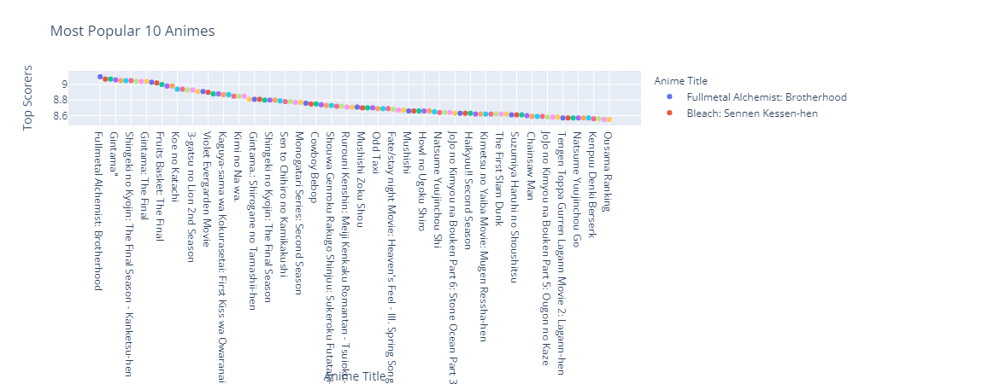

In [123]:
#Plotting top Scorers

top_scorers = df_anime.sort_values(by='Score',ascending=False)[:100]
fig = px.scatter(top_scorers, x='Name',y='Score',
             labels={'Name': 'Anime Title', 'Score': 'Top Scorers'},
             title='Most Popular 100 Animes',
             color='Name')


fig.show()

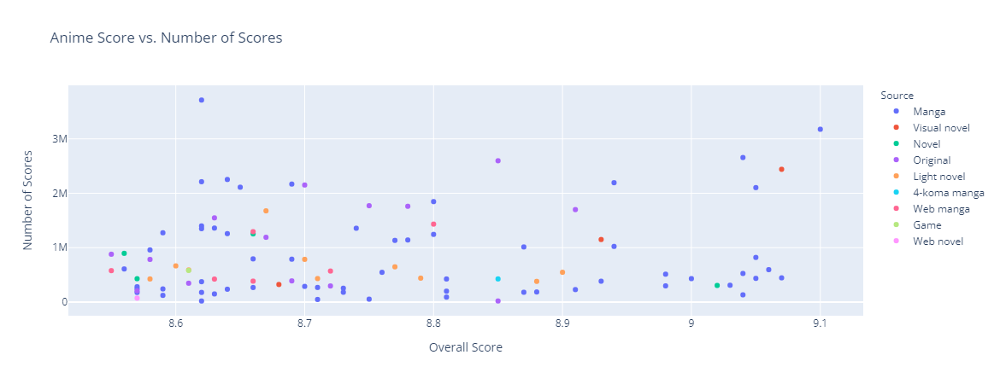

In [126]:
# Create a scatter plot
fig = px.scatter(top_scorers, x='Score', y='Members', 
                 labels={'Score':'Overall Score', 'Members':'Number of Scores'}, 
                 title='Anime Score vs. Number of Scores',
                color='Source')

fig.show()

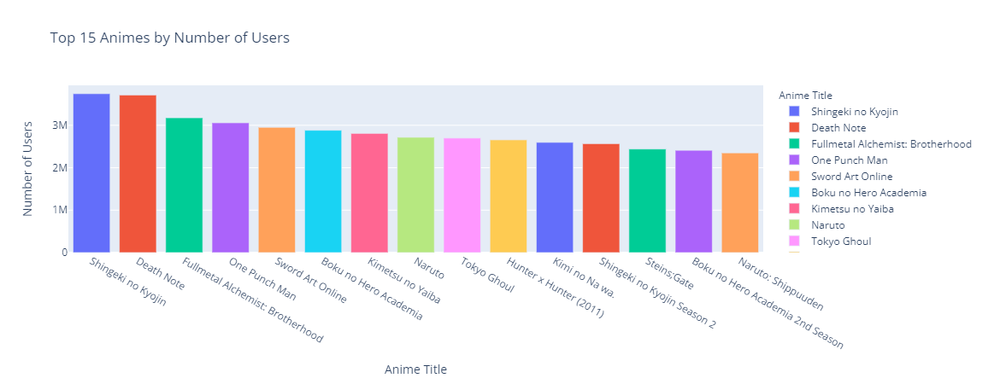

In [127]:
# Sort the dataframe by the number of users who have scored the anime
top_15_scored = df_anime.sort_values(by='Members', ascending=False).head(15)

# Create a bar chart
fig = px.bar(top_15_scored, x='Name', y='Members', labels={'Members':'Number of Users', 'Name':'Anime Title'},color='Name',
             title='Top 15 Animes by Number of Users')

fig.show()

In [128]:
# Split the genres and count their occurrences
genre_counts = df_anime['Genres'].apply(lambda x: x.split(', ')).explode().value_counts()


In [144]:
genre_counts

Genres
Comedy           12071
Fantasy           5306
Action            4730
Adventure         3842
Sci-Fi            3091
Drama             2836
Romance           2063
Slice of Life     1755
Supernatural      1494
Hentai            1486
Mystery            847
Avant Garde        804
Ecchi              795
Sports             771
Horror             534
Suspense           242
Award Winning      241
Boys Love          169
Gourmet            146
Girls Love         113
Erotica             54
Name: count, dtype: int64

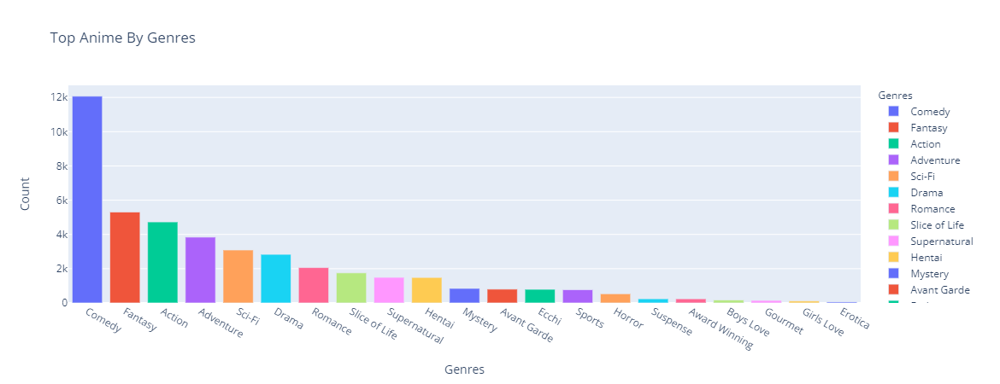

In [145]:

# Create a bar chart
fig = px.bar(genre_counts, x=genre_counts.index, y=genre_counts.values,
             labels={'x':'Genre', 'y':'Count'},
             title='Top Anime By Genres',
             color=genre_counts.index)

fig.show()

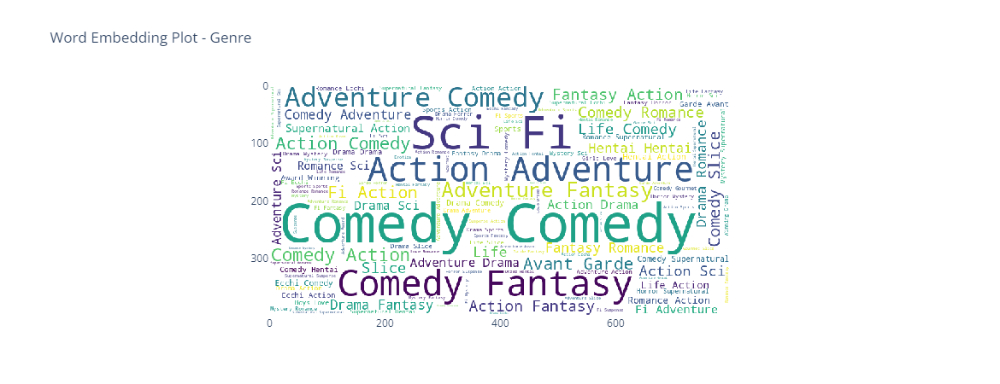

In [149]:
# Concatenate all genre values into a single string
genre_text = ' '.join(df_anime['Genres'])

# Create a WordCloud object
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(genre_text)

# Convert the WordCloud object to an image
wordcloud_image = wordcloud.to_image()

# Create a Plotly figure to display the WordCloud image
fig = go.Figure(go.Image(z=wordcloud_image))
fig.update_layout(title='Word Embedding Plot - Genre')
fig.show()

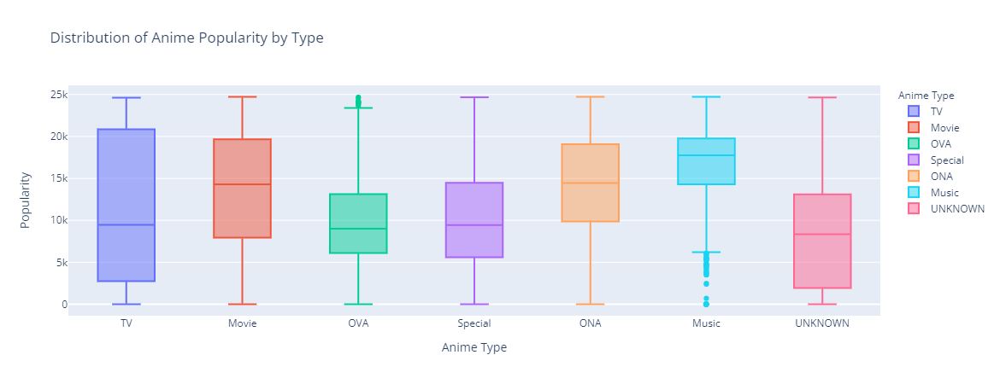

In [150]:
# Create a box plot for anime popularity by type
fig = px.box(df_anime, x='Type', y='Popularity', 
                labels={'Type':'Anime Type', 'Popularity':'Popularity'},
                title='Distribution of Anime Popularity by Type',
                color='Type')

fig.show()

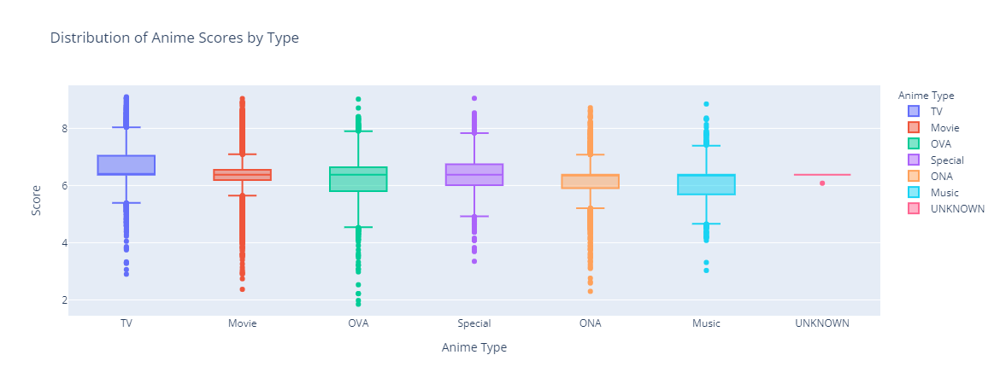

In [151]:
# Create a box plot for anime scores by type
fig = px.box(df_anime, x='Type', y='Score', 
             labels={'Type':'Anime Type', 'Score':'Score'},
             title='Distribution of Anime Scores by Type',
             color='Type')

fig.show()

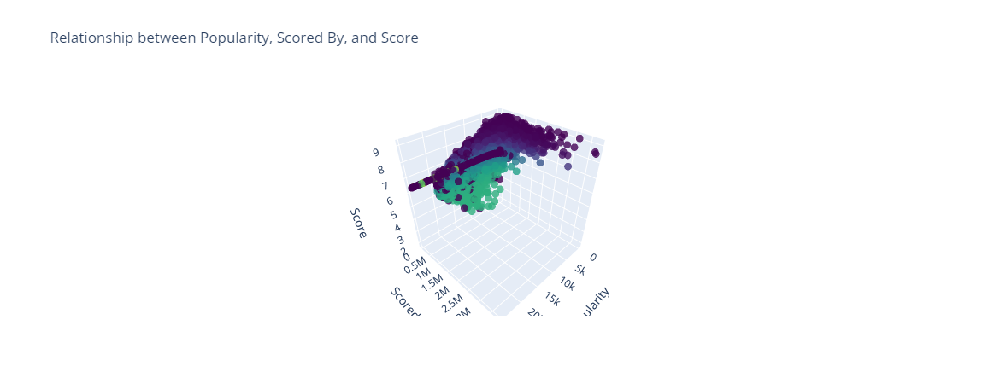

In [153]:
# Create a 3D scatter plot to visualize the relationship between popularity, scored_by, and score
fig = go.Figure(data=go.Scatter3d(
    x=df_anime['Popularity'],
    y=df_anime['Members'],
    z=df_anime['Score'],
    mode='markers',
    marker=dict(
        size=5,
        color=df_anime['Rank'],
        colorscale='Viridis',
        opacity=0.8
    ),
    text=df_anime['Name'],
    hovertemplate='<b>Title</b>: %{text}<br><b>Popularity</b>: %{x}<br><b>Scored By</b>: %{y}<br><b>Score</b>: %{z}',
))

fig.update_layout(scene=dict(
    xaxis_title='Popularity',
    yaxis_title='Scored By',
    zaxis_title='Score'
), title='Relationship between Popularity, Scored By, and Score')

fig.show()

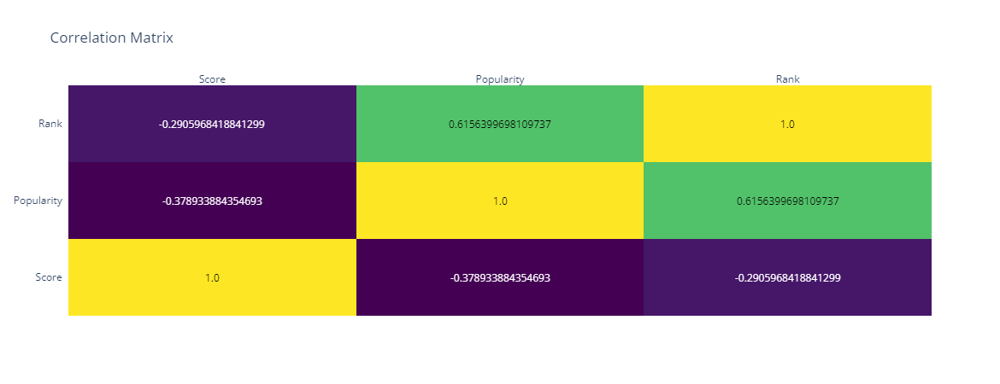

In [154]:
# Create a correlation matrix
correlation_matrix = df_anime[['Score', 'Popularity', 'Rank']].corr()

# Create a heatmap of the correlation matrix
fig = ff.create_annotated_heatmap(z=correlation_matrix.values,
                                  x=list(correlation_matrix.columns),
                                  y=list(correlation_matrix.index),
                                  colorscale='Viridis')
fig.update_layout(title='Correlation Matrix')
fig.show()

In [155]:
# Create a list of all the individual licensors
licensors_list = [licensor.strip() for licensors in df_anime['Licensors'].str.split(',') for licensor in licensors]

# Count the occurrences of each licensor
licensor_counts = pd.Series(licensors_list).value_counts()
licensor_counts

UNKNOWN                  20170
Funimation                1211
Sentai Filmworks           927
Discotek Media             491
ADV Films                  305
                         ...  
Directions                   1
Konami Cross Media NY        1
Voyager Entertainment        1
Bandai                       1
Bandai Namco Online          1
Name: count, Length: 88, dtype: int64

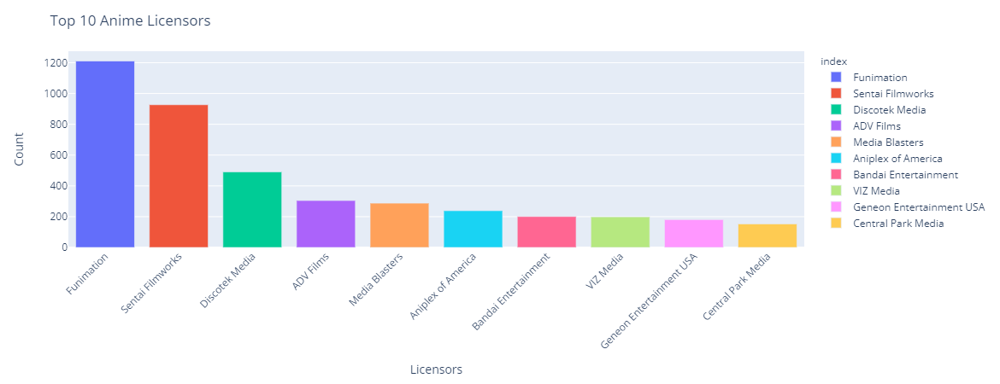

In [156]:


# Filter the licensor_counts series to exclude 'Unknown'
filtered_licensor_counts = licensor_counts[licensor_counts.index != 'UNKNOWN']

# Select the top 10 licensors
top_15_licensors = filtered_licensor_counts.head(10)

# Create the bar plot using Plotly
fig = px.bar(top_15_licensors, x=top_15_licensors.index, y=top_15_licensors.values, color=top_15_licensors.index)

# Customize the plot
fig.update_layout(
    title='Top 10 Anime Licensors',
    xaxis_title='Licensors',
    yaxis_title='Count',
    xaxis_tickangle=-45
)

# Show the plot
fig.show()

In [157]:
df_anime['Premiered'].value_counts()

Premiered
UNKNOWN        19399
spring 2017       88
fall 2016         83
spring 2018       81
spring 2016       78
               ...  
summer 1993        1
summer 1974        1
summer 1991        1
spring 1961        1
summer 2025        1
Name: count, Length: 244, dtype: int64

In [158]:
# Function to extract the season and year from the premiered string
def extract_season_year(premiered):
    if premiered == 'UNKNOWN':
        return None, None
    else:
        season, year = premiered.split()
        return season, int(year)

# Apply the function to extract the season and year from the "Premiered" column
season_year = df_anime['Premiered'].map(extract_season_year)
premiered_season = season_year.apply(lambda x: x[0])
premiered_Year = season_year.apply(lambda x: x[1])

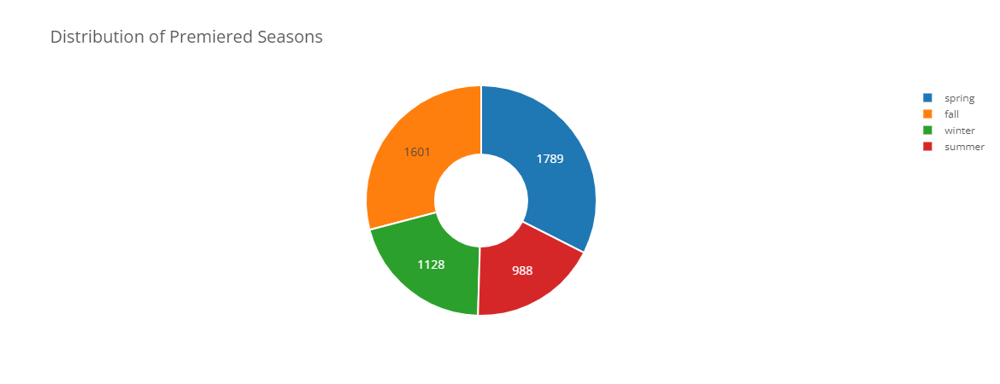

In [159]:
# Filter out None values from premiered_season
filtered_premiered_season = premiered_season.dropna()

# Count the occurrences of each season
season_counts = filtered_premiered_season.value_counts()

# Create the pie plot
fig = go.Figure(data=go.Pie(
    labels=season_counts.index,
    values=season_counts.values,
    hole=0.4,  # Add a donut hole in the center
    hoverinfo='label+percent',  # Display label and percentage on hover
    textinfo='value',  # Display count value as text inside each slice
    textfont=dict(size=14),  # Set the text font size
    marker=dict(
        colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd'],  # Custom color palette
        line=dict(color='#ffffff', width=2)  # Set the color and width of the slice borders
    )
))

# Set the title and font style for the plot
fig.update_layout(
    title='Distribution of Premiered Seasons',
    title_font=dict(size=20),
    font=dict(size=12, color='#555555')
)

fig.show()

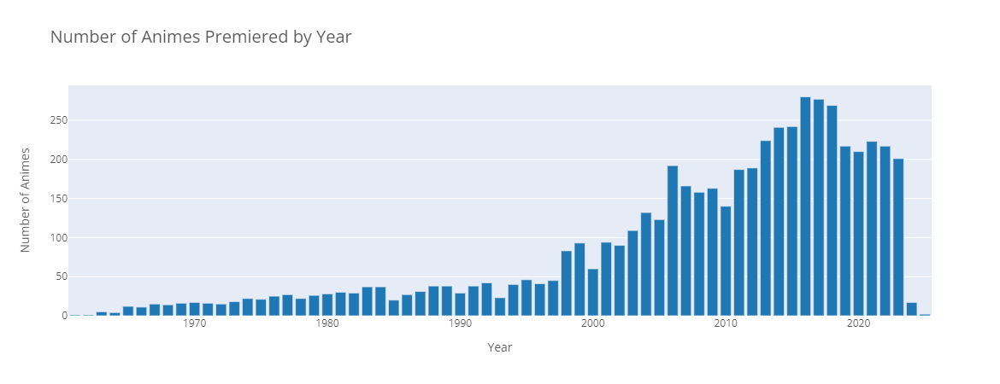

In [160]:
# Filter out None values from premiered_Year
filtered_premiered_year = premiered_Year.dropna()

# Count the occurrences of each year
year_counts = filtered_premiered_year.value_counts()

# Sort the years in ascending order
sorted_years = sorted(year_counts.index)

# Create the bar plot
fig = go.Figure(data=go.Bar(
    x=sorted_years,
    y=year_counts[sorted_years],
    marker=dict(color='#1f77b4'),  # Set the color of the bars
))

# Set the title and axis labels
fig.update_layout(
    title='Number of Animes Premiered by Year',
    xaxis_title='Year',
    yaxis_title='Number of Animes',
    title_font=dict(size=20),
    font=dict(size=12, color='#555555')
)

fig.show()

In [161]:
df_anime['Studios'].value_counts()

Studios
UNKNOWN                            10526
Toei Animation                       834
Sunrise                              532
J.C.Staff                            385
Shanghai Animation Film Studio       335
                                   ...  
Ordet, Encourage Films                 1
Hoods Entertainment, Felix Film        1
Kaeruotoko Shokai                      1
MooGoo, Studio Ranmaru                 1
Youku                                  1
Name: count, Length: 1547, dtype: int64

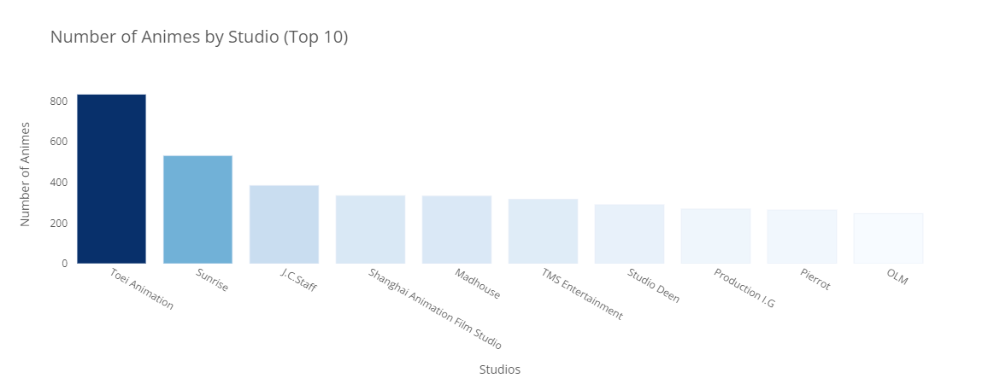

In [162]:
# Count the occurrences of each studio
studio_counts = df_anime['Studios'].value_counts()

# Filter the studio_counts series to exclude 'Unknown'
studio_counts = studio_counts[studio_counts.index != 'UNKNOWN']

# Select the top 10 studios with the highest number of animes
top_studios = studio_counts.head(10)

# Create the bar plot
fig = go.Figure(data=go.Bar(
    x=top_studios.index,
    y=top_studios.values,
    marker=dict(color=top_studios.values, colorscale='Blues'),  # Set the color of the bars using a colorscale
    text=top_studios.values,  # Set the text to be displayed on hover
    hovertemplate='Studio: %{x}<br>Number of Animes: %{y}<extra></extra>',  # Customize the hover template
))

# Set the title and axis labels
fig.update_layout(
    title='Number of Animes by Studio (Top 10)',
    xaxis_title='Studios',
    yaxis_title='Number of Animes',
    title_font=dict(size=20),
    font=dict(size=12, color='#555555'),
    plot_bgcolor='rgba(0, 0, 0, 0)'  # Set the background color to transparent
)

fig.show()


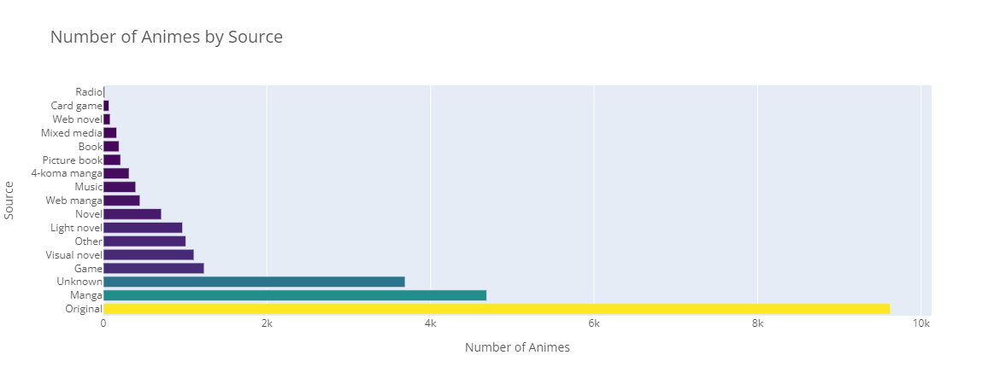

In [163]:
# Count the occurrences of each source
source_counts = df_anime['Source'].value_counts()

# Filter the source_counts series to exclude 'Unknown'
source_counts = source_counts[source_counts.index != 'UNKNOWN']

# Create the horizontal bar chart
fig = go.Figure(data=go.Bar(
    x=source_counts.values,
    y=source_counts.index,
    orientation='h',  # Set the orientation to horizontal
    marker=dict(color=source_counts.values, colorscale='Viridis'),  # Set the color of the bars using a colorscale
    text=source_counts.values,  # Set the text to be displayed on hover
    hovertemplate='Source: %{y}<br>Number of Animes: %{x}<extra></extra>',  # Customize the hover template
))

# Set the title and axis labels
fig.update_layout(
    title='Number of Animes by Source',
    xaxis_title='Number of Animes',
    yaxis_title='Source',
    title_font=dict(size=20),
    font=dict(size=12, color='#555555')
)

fig.show()


In [164]:
df_anime['Favorites'].value_counts() #how many users have marked it has favourite

Favorites
0        10808
1         2310
2         1202
3          798
4          543
         ...  
1948         1
2022         1
21987        1
2543         1
706          1
Name: count, Length: 1814, dtype: int64

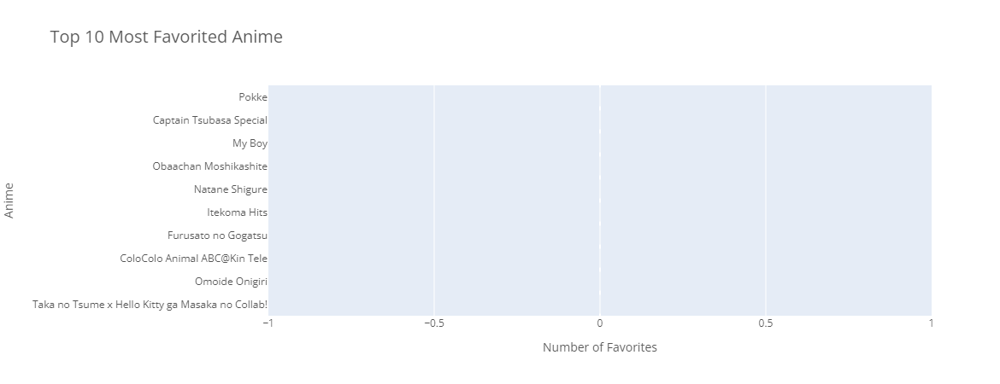

In [166]:
# Sort the DataFrame by the 'Favorites' column in descending order
sorted_df = df_anime.sort_values('Favorites', ascending=True)

# Select the top 10 most favorited anime
top_favorites = sorted_df.head(10)

# Create the horizontal bar chart
fig = go.Figure(data=go.Bar(
    x=top_favorites['Favorites'],
    y=top_favorites['Name'],
    orientation='h',  # Set the orientation to horizontal
    marker=dict(color='#1f77b4'),  # Set the color of the bars
    text=top_favorites['Favorites'],  # Set the text to be displayed on hover
    hovertemplate='Anime: %{y}<br>Favorites: %{x}<extra></extra>',  # Customize the hover template
))

# Set the title and axis labels
fig.update_layout(
    title='Top 10 Most Favorited Anime',
    xaxis_title='Number of Favorites',
    yaxis_title='Anime',
    title_font=dict(size=20),
    font=dict(size=12, color='#555555')
)

fig.show()


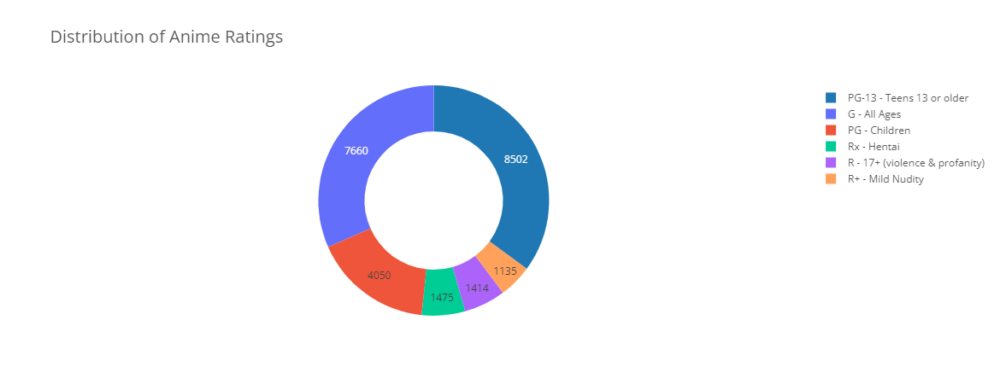

In [167]:
# Count the occurrences of each rating
rating_counts = df_anime[df_anime['Rating']!="UNKNOWN"]['Rating'].value_counts()

# Filter the rating_counts series to exclude 'Unknown'
rating_counts = rating_counts[rating_counts.index != 'Unknown']

# Create the pie plot
fig = go.Figure(data=go.Pie(
    labels=rating_counts.index,
    values=rating_counts.values,
    hoverinfo='label+percent',
    textinfo='value',
    textfont=dict(size=12),
    marker=dict(colors=['#1f77b4']),  # Set the same color for all segments
    hole=0.6,  # Set the size of the inner hole to create a donut shape
))

# Set the title
fig.update_layout(
    title='Distribution of Anime Ratings',
    title_font=dict(size=20),
    font=dict(size=12, color='#555555'),
)

fig.show()


In [168]:
# Function to map abbreviated language codes to full names
def map_language_code(code):
    language_mapping = {
        'ja': 'Japanese',
        'ko': 'Korean',
        'zh-cn': 'Simplified Chinese',
        'de': 'German',
        'vi': 'Vietnamese',
        'en': 'English',
        'zh-tw': 'Traditional Chinese'
    }
    return language_mapping.get(code, 'Other')

# Function to detect language
def detect_language(name):
    try:
        return detect(name)
    except:
        return None  # Return None for rows where detection fails


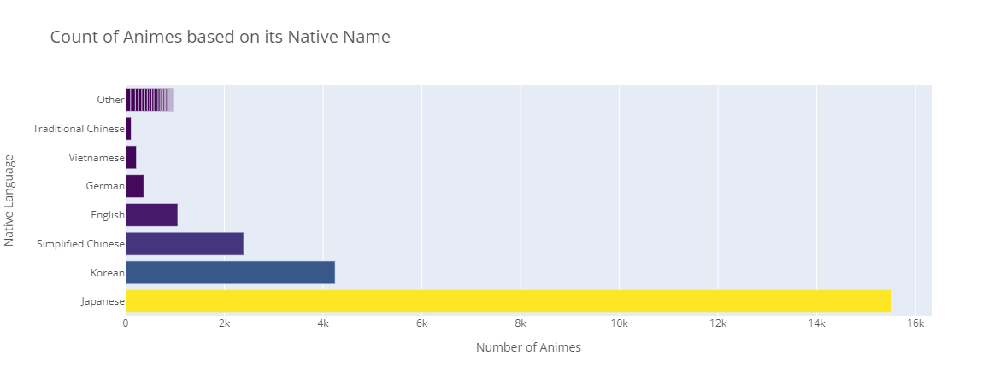

In [169]:
# Apply language detection to the 'Other name' column
Detected_Language = df_anime[df_anime['Other name']!="UNKNOWN"]['Other name'].apply(detect_language)

# Drop rows where language detection failed (i.e., where Detected_Language is None)
Detected_Language = Detected_Language.dropna()

# Count the occurrences of each language
language_counts = Detected_Language.value_counts()

# Map abbreviated language codes to full names for plotting
language_counts.index = language_counts.index.map(map_language_code)

fig = go.Figure(data=go.Bar(
    x=language_counts.values,
    y=language_counts.index,
    orientation='h',
    marker=dict(color=language_counts.values, colorscale='Viridis'),
    text=language_counts.values,  # Set the text to be displayed on hover
    hovertemplate='Native Language: %{y}<br>Number of Animes: %{x}<extra></extra>',
))

# Set the title and axis labels
fig.update_layout(
    title='Count of Animes based on its Native Name',
    xaxis_title='Number of Animes',
    yaxis_title='Native Language',
    title_font=dict(size=20),
    font=dict(size=12, color='#555555')
)

fig.show()

In [ ]:
#For User Dataset

In [171]:
df_user.isna().sum()

Mal ID              0
Username            0
Gender              0
Birthday            0
Location            0
Joined              0
Days Watched        0
Mean Score          0
Watching            0
Completed           0
On Hold             0
Dropped             0
Plan to Watch       0
Total Entries       0
Rewatched           0
Episodes Watched    0
dtype: int64

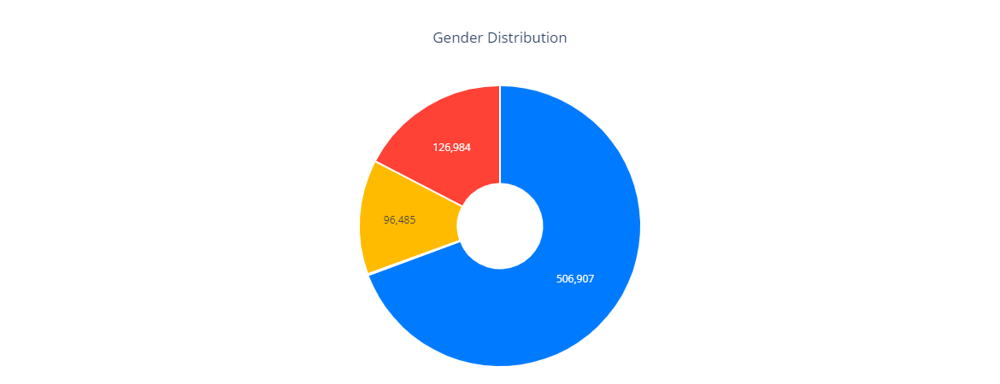

In [170]:
# Distribution of gender
# Count the occurrences of each gender
gender_counts = df_user['Gender'].value_counts(dropna=True)

# Define custom colors for the pie slices
colors = ['rgb(0, 123, 255)', 'rgb(255, 65, 54)', 'rgb(255, 187, 0)', 'rgb(125, 125, 125)']

# Create the pie plot
fig = go.Figure()

fig.add_trace(go.Pie(
    labels=gender_counts.index,
    values=gender_counts.values,
    hole=0.3,
    marker=dict(colors=colors, line=dict(color='#FFFFFF', width=2)),
    hoverinfo='label+percent',
    hovertemplate='<b>%{label}</b><br>%{percent}',
    textinfo='value',
    textposition='inside',
    sort=False
))

# Customize the layout
fig.update_layout(
    title='Gender Distribution',
    title_x=0.5,
    uniformtext_minsize=12,
    uniformtext_mode='hide',
    showlegend=False,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    margin=dict(l=20, r=20, t=100, b=20),
)

# Show the plot
fig.show()

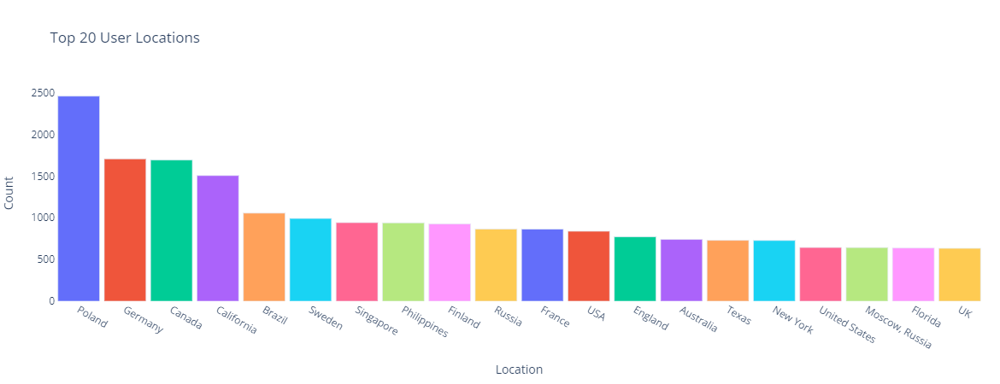

In [172]:
# Location analysis
# Count the occurrences of each location
location_counts = df_user[df_user['Location']!='Not Specified']['Location'].value_counts()

# Create a bar chart
fig = px.bar(location_counts.head(20),
             x=location_counts.head(20).index,
             y=location_counts.head(20).values,
             labels={'x': 'Location', 'y': 'Count'},
             title='Top 20 User Locations',
             color=location_counts.head(20).index)

# Customize the layout
fig.update_layout(
    xaxis=dict(title='Location'),
    yaxis=dict(title='Count'),
    bargap=0.1,
    showlegend=False,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    margin=dict(l=50, r=20, t=100, b=50),
)

# Show the plot
fig.show()


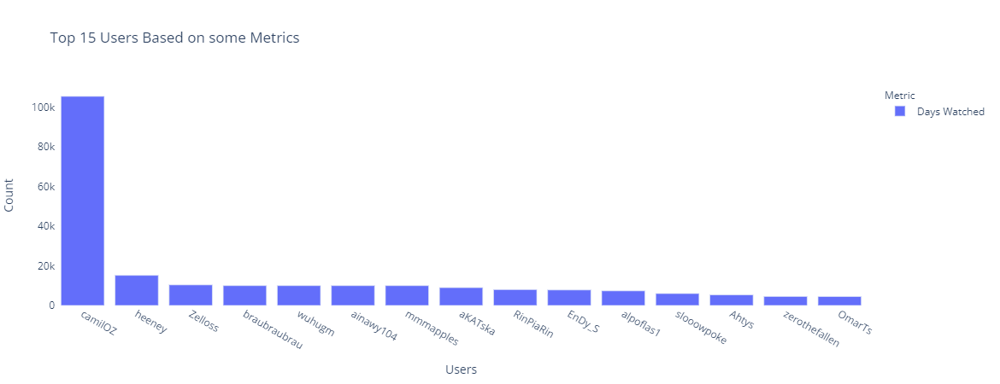

In [173]:
# Define the metrics you want to consider for top users
metrics = ['Days Watched']
# You can change the metrics to 'Mean Score', 'Watching', 'Completed', 'On Hold', 'Dropped', 'Plan to Watch' or include
# a combination of them to see the comparison b/w them such as Watching vs. Completed

# Initialize an empty DataFrame to store the top users
top_users = pd.DataFrame()

for metric in metrics:
    top_users = pd.concat([top_users, df_user.nlargest(15, metric)], ignore_index=True)

# Create a bar chart for the top users based on the chosen metrics
fig = px.bar(top_users, x='Username', y=metrics, barmode='group',
             title='Top 15 Users Based on some Metrics',
             labels={'value': 'Count', 'variable': 'Metric'},
             color_discrete_sequence=px.colors.qualitative.Plotly)

# Customize the layout
fig.update_layout(
    xaxis=dict(title='Users'),
    yaxis=dict(title='Count'),
    legend_title_text='Metric',
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    margin=dict(l=50, r=20, t=100, b=50),
)

# Show the plot
fig.show()

In [ ]:
#For User Score Dataset

In [177]:
df_score.groupby('Anime Title')['user_id'].nunique()

Anime Title
!NVADE SHOW!                                    20
"0"                                            151
"Bungaku Shoujo" Kyou no Oyatsu: Hatsukoi     3069
"Bungaku Shoujo" Memoire                      3362
"Bungaku Shoujo" Movie                        6113
                                             ...  
xxxHOLiC Rou                                  4121
xxxHOLiC Shunmuki                             5187
xxxHOLiC◆Kei                                 10396
ēlDLIVE                                       1094
◯                                               63
Name: user_id, Length: 16611, dtype: int64

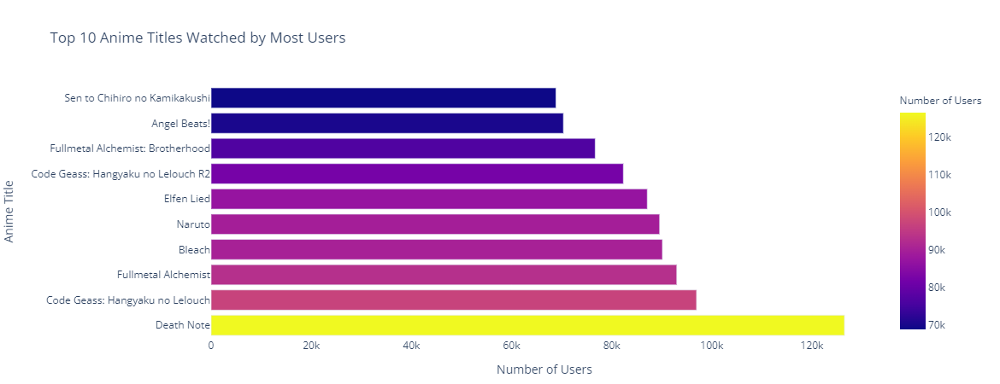

In [174]:
# Animes that was watched by most users in the df_score dataset

# Get the count of users who watched each anime title
anime_watch_count = df_score.groupby('Anime Title')['user_id'].nunique().reset_index()
anime_watch_count = anime_watch_count.rename(columns={'user_id': 'User Count'})

# Sort the dataframe in descending order by the number of users
anime_watch_count = anime_watch_count.sort_values(by='User Count', ascending=False)

# Select the top 10 anime titles with the highest number of users
top_n = 10
top_anime_watch_count = anime_watch_count.head(top_n)

# Define a colorful color palette
color_palette = px.colors.qualitative.Plotly

# Create the bar chart with colorful bars
fig = px.bar(top_anime_watch_count, x='User Count', y='Anime Title', orientation='h',
             title=f'Top {top_n} Anime Titles Watched by Most Users',
             labels={'User Count': 'Number of Users', 'Anime Title': 'Anime Title'},
             color='User Count',
             color_discrete_sequence=color_palette)

# Customize the layout
fig.update_layout(showlegend=False, paper_bgcolor='rgba(0,0,0,0)', plot_bgcolor='rgba(0,0,0,0)',
                  margin=dict(l=50, r=20, t=100, b=50))

# Show the plot
fig.show()